# Problem 1 (Binary classification of PneumonaiMDMNIST images)

In [1]:
# all the imports are listed here
import numpy as np 
import matplotlib.pyplot as plt
import sklearn.metrics as metrics
import math
import matplotlib as mpl
import os
# NO SKLEARN HAS BEEN USED FOR MACHINE LEARNING, only the METRICS subpackage has been imported to compute AUC, F1 scores and so on.

Lets import the required data and noramalise it as required.


In [2]:
def load_input(inputpath):
    folder = np.load(inputpath)
    files = folder.files
    # print(files)
    # First we load the images and the labels
    un_train_images = folder['train_images.npy']
    un_val_images = folder['val_images.npy']
    un_test_images = folder['test_images.npy']
    train_labels = folder['train_labels.npy']
    val_labels = folder['val_labels.npy']
    test_labels = folder['test_labels.npy']
    # Then we normalize the images
    train_images = normalize_images(un_train_images)
    val_images = normalize_images(un_val_images)
    test_images = normalize_images(un_test_images)
    return train_images, val_images, test_images, train_labels, val_labels, test_labels


def normalize_images(images: np):
    new_images = np.zeros((images.shape[0], images.shape[1] * images.shape[2]))
    for i in range(images.shape[0]):
        new_images[i] = images[i].flatten()
    new_images = new_images.astype(np.float32)
    new_images /= 255.0
    return new_images

def flatten_labels(labels):
    flat_labels = []
    for i in range(len(labels)):
        flat_labels.append(labels[i][0])
    return np.array(flat_labels)

def concat_one(images):
    ones = np.ones((np.shape(images)[0],1))
    images = np.append(images, ones, axis=1)
    return images

best_methods_AUC=dict()
best_methods_ACC=dict()

In [3]:
os.chdir('D:\PRNN\PRNN_final')
inputpath="pneumoniamnist.npz"
train_images, val_images, test_images, train_labels, val_labels, test_labels = load_input(inputpath)
TrainLabels, TestLabels = flatten_labels(train_labels), flatten_labels(test_labels)
print('Training set:', len(TrainLabels))
print('Test set:', len(TestLabels))
TrainData, TestData = concat_one(train_images), concat_one(test_images)


Training set: 4708
Test set: 624


In [4]:
os.chdir('D:\PRNN')
from samplesound import Trainer

In [5]:
T = Trainer()

Lets get started with and try to solve this problem using various methods and test them using the scoring methods. We also create a testing function for convenience.

In [6]:
def Test(TestData, TestLabels, test_function, **kwargs):
    GuessedLabels = []
    for i in range(len(TestData)):
        GuessedLabels.append(1 if test_function(TestData[i], **kwargs) > 0.5 else 0)

    return [metrics.f1_score(TestLabels, GuessedLabels), metrics.accuracy_score(TestLabels, GuessedLabels), metrics.roc_auc_score(TestLabels, GuessedLabels)]

<center> <h3> K Nearest Neighbours</h3> </center>
Lets get right to it and write up the  core function to perform KNN

In [8]:
def knn_naive(X_train, Y_train, X_test, *, k=5, metric=2):
    # First we difeine a small function to return the k smallet elements of an array
    def k_smallest(arr, k):
        x = []
        min = np.inf
        pos_min = -1
        for i in range(k):
            for i in range(len(arr)):
                if arr[i] < min and i not in x:
                    min = arr[i]
                    pos_min = i
            if pos_min != -1:
                x.append(pos_min)
                min = np.inf
                pos_min = -1
        return x

    Y_test_predicted = np.zeros((X_test.shape[0], 1))
    if k == 0:
        return Y_test_predicted
    for i in range(X_test.shape[0]):
        distances = np.linalg.norm(np.abs(X_train - X_test[i, :]), ord=metric, axis=1)

        nearest = k_smallest(distances, k)
        topk_y = [i[0] for i in Y_train[nearest[:k]]]
        Y_test_predicted[i] = [np.argmax(np.bincount(topk_y))]

    return Y_test_predicted


Lets now run a small experiment, giving different values of k for KN

In [11]:
  # Write this line at the beginning of cell

# Here is the content of the cell
k_max=20
no_of_tests=4
x_graph = np.zeros((no_of_tests,k_max))
AUCscores = np.zeros(x_graph.shape)
ACCscores = np.zeros(x_graph.shape)
F1scores = np.zeros(x_graph.shape)

for j in range(no_of_tests):
    metric=j
    if j==0:
        metric =-math.inf
    elif j==no_of_tests-1:
        metric = math.inf
    for k in range(0, k_max):
        test_pred = knn_naive(train_images, train_labels, test_images, k=k, metric=metric)
        x_graph[j,k] = k
        F1scores[j,k] =metrics.f1_score(test_labels,test_pred)
        ACCscores[j,k] =metrics.accuracy_score(test_labels,test_pred)
        AUCscores[j,k] =metrics.roc_auc_score(test_labels,test_pred)


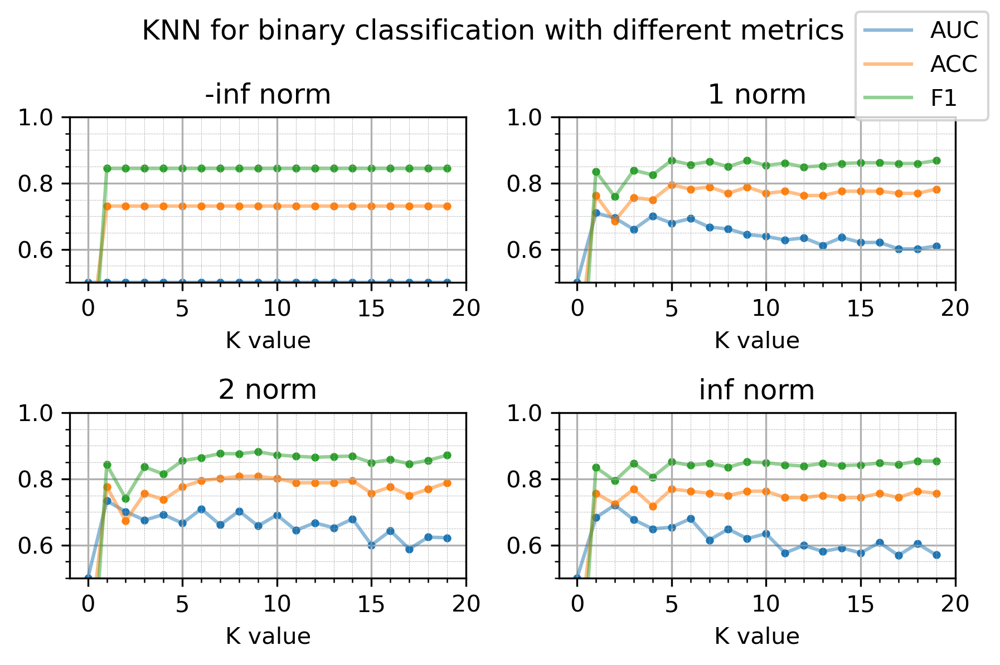

In [13]:
mpl.rcParams['figure.dpi'] = 300
for j in range(no_of_tests):
    metric=j
    if j==0:
        metric =-math.inf
    elif j==no_of_tests-1:
        metric = math.inf
    plt.subplot(2,2,j+1)
    plotter(x_graph[j],AUCscores[j],ACCscores[j],F1scores[j],str(metric)+" norm","K value",first=(j==0))
    plt.xticks(np.linspace(0, k_max, 5))

plt.suptitle("KNN for binary classification with different metrics")
plt.tight_layout()

#plt.figlegend(['AUC', 'ACC', 'F1'])

plt.show()

In [38]:
def plotter(x_graph, AUCscores, ACCscores, F1scores, title, xlabel,*,first=False):

    plt.plot(x_graph, AUCscores,alpha=0.5)
    plt.plot(x_graph, ACCscores,alpha=0.5 )
    plt.plot(x_graph, F1scores,alpha=0.5)
    plt.scatter(x_graph, AUCscores,s=6)
    plt.scatter(x_graph, ACCscores,s=6)
    plt.scatter(x_graph, F1scores,s=6)

    plt.xlabel(xlabel)

    plt.title(title)
    plt.ylim(0.5,1)
    plt.grid(True, which='major')
    plt.grid(True, which='minor',linestyle='--',linewidth=0.2)
    plt.minorticks_on()

    if first:
        plt.figlegend(['AUC', 'ACC', 'F1'])

In [14]:
count=0
print("best metrics according to AUC")
for i in np.argsort(AUCscores,axis=None,)[-3:]:
    best_metric,best_k =int( i//k_max), int(i%k_max    )
    best_score = AUCscores[int(best_metric)][int(best_k)]
    if best_metric==0:
        best_metric =-math.inf
    elif best_metric==no_of_tests-1:
        best_metric = math.inf
    print('\t'+str(3-count)+" best metric is ", best_metric,"(k=",best_k,")with a score of ",best_score)
    if 3-count==1:
        best_methods_AUC["KNN" + "(metric=" + str(best_metric) + ", k=" + str(best_k)]=best_score
    count+=1
print("best metrics according to ACC")
count=0
for i in np.argsort(ACCscores,axis=None,)[-3:]:
    best_metric,best_k =int( i//k_max), int(i%k_max    )
    best_score = ACCscores[int(best_metric)][int(best_k)]
    if best_metric==0:
        best_metric =-math.inf
    elif best_metric==no_of_tests-1:
        best_metric = math.inf
    print('\t'+str(3-count)+" best metric is ", best_metric,"(k=",best_k,")with a score of ",best_score)
    if 3-count==1:
        best_methods_AUC["KNN" + "(metric=" + str(best_metric) + ", k=" + str(best_k)]=best_score
    count+=1
%reset_selective -f AUCscores ACCscores F1scores x_graph k_max no_of_tests metric j k test_pred best_metric best_k best_score

best metrics according to AUC
	3 best metric is  1 (k= 1 )with a score of  0.7098997493734336
	2 best metric is  inf (k= 2 )with a score of  0.7211779448621555
	1 best metric is  2 (k= 1 )with a score of  0.7337092731829573
best metrics according to ACC
	3 best metric is  2 (k= 7 )with a score of  0.8012820512820513
	2 best metric is  2 (k= 9 )with a score of  0.8076923076923077
	1 best metric is  2 (k= 8 )with a score of  0.8076923076923077


<h2><center>Linear Regression</center></h2>

Now lets implement Linear Regression using Least squares method with no regularization and with L2 Regularization(since both of them have a closed form expression)
It must be noted that Linear Regression is NOT an ideal method for classification problems.

In [32]:
def leastsq1(x, y, lambda_hyper=0):
    a = transformX(x)
    cov_matrix = np.matmul(a.T, a) + lambda_hyper * np.identity(a.shape[1])
    return np.linalg.solve(cov_matrix, np.dot(a.T, y))


def transformX(x):
    return np.column_stack((x, np.ones(x.shape[0])))


def least_squares_classifier(X_train, y_train, X_test, *, lambda_hyper=0):
    w = leastsq1(X_train, y_train, lambda_hyper)
    y_pred = np.dot(transformX(X_test), w)
    return y_pred

In [29]:
#basic classiffier
test_pred=least_squares_classifier(train_images, train_labels, test_images)
for i in range(len(test_pred)):
    if test_pred[i][0]>=0.5:
        test_pred[i][0]=1
    else:
        test_pred[i][0]=0

F1score =metrics.f1_score(test_labels,test_pred)
ACCscore =metrics.accuracy_score(test_labels,test_pred)
AUCscore =metrics.roc_auc_score(test_labels,test_pred)
print("F1 score:",F1score, "ACCscore: ",ACCscore, "AUC score:",AUCscore)

F1 score: 0.5056179775280898 ACCscore:  0.4358974358974359 AUC score: 0.4711779448621555


In [70]:
k_max=50

x_graph = np.zeros((k_max))
AUCscores = np.zeros(x_graph.shape)
ACCscores = np.zeros(x_graph.shape)
F1scores = np.zeros(x_graph.shape)

for k in range(0, k_max):
    hyperparamereter=math.exp(-k/10)
    test_pred = least_squares_classifier(train_images, train_labels, test_images, lambda_hyper=hyperparamereter)
    for i in range(len(test_pred)):
        if test_pred[i][0] < 0.5:
            test_pred[i][0] = 0
        else:
            test_pred[i][0] = 1
    x_graph[k] = hyperparamereter
    F1scores[k] =metrics.f1_score(test_labels,test_pred)
    ACCscores[k] =metrics.accuracy_score(test_labels,test_pred)
    AUCscores[k] =metrics.roc_auc_score(test_labels,test_pred)

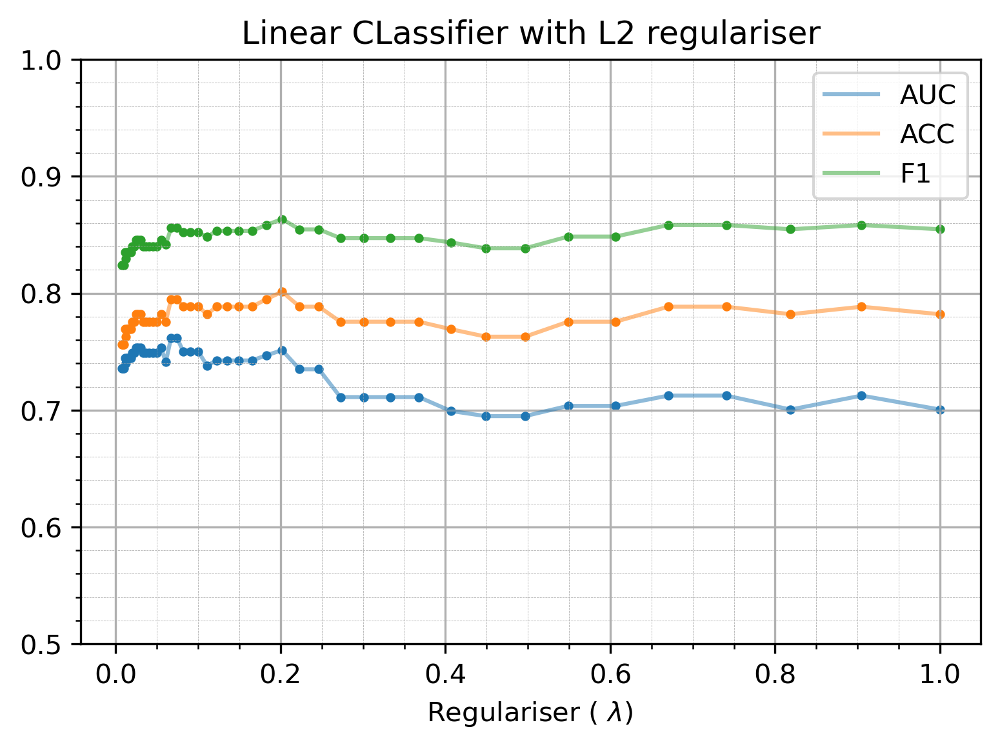

In [71]:
plotter(x_graph,AUCscores,ACCscores,F1scores,"Linear CLassifier with L2 regulariser","Regulariser ( $\lambda $) ")
plt.legend(['AUC', 'ACC', 'F1']);

In [53]:
count=0
print("best metrics according to AUC")
for i in np.argsort(AUCscores,axis=None,)[-3:]:

    best_score = AUCscores[i]

    print('\t'+str(3-count)+" best regulariser is  ", round(x_graph[i],3),"With score" ,round(best_score,3))
    if 3-count==1:
        best_methods_AUC["Least squares with regulariser ",x_graph[i]]=best_score
    count+=1
print("best metrics according to ACC")
count=0

for i in np.argsort(ACCscores,axis=None,)[-3:]:

    best_score = ACCscores[i]

    print('\t'+str(3-count)+" best regulariser is  ", round(x_graph[i],3),"With score" ,round(best_score,3))
    if 3-count==1:
        best_methods_ACC["Least squares with regulariser ",x_graph[i]]=best_score
    count+=1

%reset_selective -f AUCscores ACCscores F1scores x_graph k_max test_pred  best_score

best metrics according to AUC
	3 best regulariser is   0.03 With score 0.753
	2 best regulariser is   0.067 With score 0.762
	1 best regulariser is   0.074 With score 0.762
best metrics according to ACC
	3 best regulariser is   0.074 With score 0.795
	2 best regulariser is   0.183 With score 0.795
	1 best regulariser is   0.202 With score 0.801


### Linear with L1 and elastic regularisation
To get an approximate idea of optimum number of iterations for gradient descent on MSE, without regularisation:

sum(w): 4.2734837760061836e-18
sum(w): -94.70437210456691
sum(w): -7284.697605242812
sum(w): -507357.21951278154
sum(w): -38575842.21412138
sum(w): -3152343397.916506
sum(w): -240557349253.11346
sum(w): -21015124218676.15
sum(w): -1241654303052187.5
sum(w): -9.226084749631864e+16
sum(w): -8.030855565145571e+18
sum(w): -7.31884992429623e+20
sum(w): -3.9647229791853605e+22
sum(w): -3.046728101154382e+24
sum(w): -2.563378604943385e+26
sum(w): -1.6305655257807204e+28
sum(w): -1.3493973751857608e+30
sum(w): -8.643551781003424e+31
sum(w): -7.74390809241615e+33
sum(w): -6.992043848179566e+35


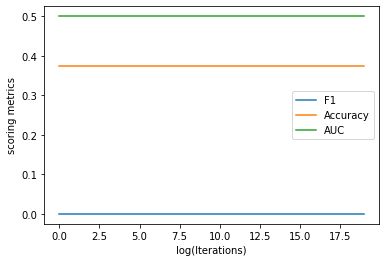

In [18]:
F1s, accuracies, AUCs = [],[],[]
for i in range(20):
    T.MSE_reg_trained = False
    T.MSE_reg_Train(TrainData, TrainLabels, 0.00001, 10*i, 0, 0)
    print("sum(w):", np.sum(T.MSE_L1_w))
    scores = Test(TestData, TestLabels, T.MSE_reg_Return)
    F1s.append(scores[0])
    accuracies.append(scores[1])
    AUCs.append(scores[2])

plt.plot(range(20), F1s, label = 'F1')
plt.plot(range(20), accuracies, label = 'Accuracy')
plt.plot(range(20), AUCs, label = 'AUC')


plt.xlabel('log(Iterations)')
plt.ylabel('scoring metrics')
plt.legend()
plt.show()

As it can be seen we're in dire need of regularisation as the model diverges very fast, resulting in no useful result.

In [ ]:
accuracy_mesh = np.zeros([10,10])
for i in range(-10,10,2):
    for j in range(-10,10,2):
        T.MSE_reg_trained = False
        T.MSE_reg_Train(TrainData,TrainLabels,0.01,100,10**(i),10**(j))
        scores = Test(TestData, TestLabels, T.MSE_reg_Return)
        accuracy_mesh[int(i/2)+5][int(j/2)+5]=scores[1]
        print(i,j)

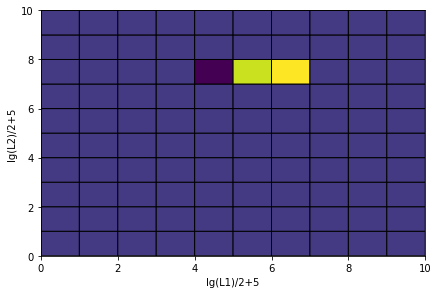

Best: 0.7403846153846154


In [19]:
fig, (ax0) = plt.subplots(1,1)
ax0.pcolor(accuracy_mesh, edgecolor='black', linewidth=1)
fig.tight_layout()
ax0.set_xlabel('lg(L1)/2+5')
ax0.set_ylabel('lg(L2)/2+5')
plt.show()
print('Best:', np.max(np.max(accuracy_mesh)))

<h2><center>Logistic Regression</center></h2>

In [22]:
F1s, accuracies, AUCs = [],[],[]
T.Logistic_trained = False
for i in range(7):

    T.Logistic_Train(TrainData, TrainLabels, 0.0001, 10**i, 0, 0)
    scores = Test(TestData, TestLabels, T.Logistic_Return)
    F1s.append(scores[0])
    accuracies.append(scores[1])
    AUCs.append(scores[2])

KeyboardInterrupt: 

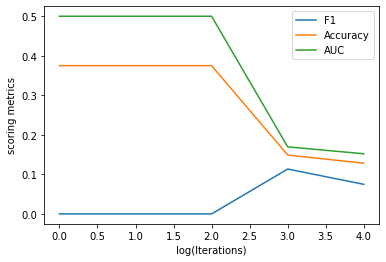

In [21]:
plt.plot(range(7), F1s, label = 'F1')
plt.plot(range(7), accuracies, label = 'Accuracy')
plt.plot(range(7), AUCs, label = 'AUC')


plt.xlabel('log(Iterations)')
plt.ylabel('scoring metrics')
plt.legend()
plt.show()

With L1 Regularisation:

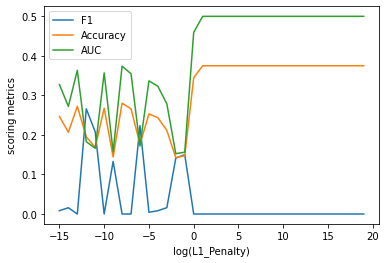

In [25]:
F1s, accuracies, AUCs = [],[],[]
for i in range(-15,20):
    T.Logistic_trained = False
    T.Logistic_Train(TrainData,TrainLabels,0.001,100,10**(i),0)
    scores = Test(TestData, TestLabels, T.Logistic_Return)
    F1s.append(scores[0])
    accuracies.append(scores[1])
    AUCs.append(scores[2])

plt.plot(range(-15,20), F1s, label = 'F1')
plt.plot(range(-15,20), accuracies, label = 'Accuracy')
plt.plot(range(-15,20), AUCs, label = 'AUC')

plt.xlabel('log(L1_Penalty)')
plt.ylabel('scoring metrics')
plt.legend()
plt.show()

With L2 Regularisation:

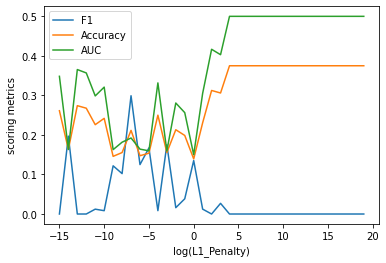

In [26]:
F1s, accuracies, AUCs = [],[],[]
for i in range(-15,20):
    T.Logistic_trained = False
    T.Logistic_Train(TrainData,TrainLabels,0.001,100,0,10**(i))
    scores = Test(TestData, TestLabels, T.Logistic_Return)
    F1s.append(scores[0])
    accuracies.append(scores[1])
    AUCs.append(scores[2])

plt.plot(range(-15,20), F1s, label = 'F1')
plt.plot(range(-15,20), accuracies, label = 'Accuracy')
plt.plot(range(-15,20), AUCs, label = 'AUC')

plt.xlabel('log(L1_Penalty)')
plt.ylabel('scoring metrics')
plt.legend()
plt.show()

With elastic regularisation:

In [ ]:
accuracy_mesh = np.zeros([10,10])
for i in range(-10,10,2):
    for j in range(-10,10,2):
        T.Logistic_trained = False
        T.Logistic_Train(TrainData,TrainLabels,0.1,100,10**(i),10**(j))
        scores = Test(TestData, TestLabels, T.Logistic_Return)
        accuracy_mesh[int(i/2)+5][int(j/2)+5]=scores[1]
        print(i,j)

In [38]:
print('Best:', np.max(np.max(accuracy_mesh)))

Best: 0.7051282051282052


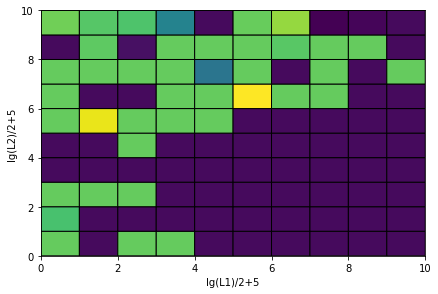

In [39]:
fig, (ax0) = plt.subplots(1,1)
ax0.pcolor(accuracy_mesh, edgecolor='black', linewidth=1)
fig.tight_layout()
ax0.set_xlabel('lg(L1)/2+5')
ax0.set_ylabel('lg(L2)/2+5')
plt.show()

### Polynomial Kernels
As poly kernels take exceptionally long, and huge memory as well, we only run for a few number of degrees. I tried running it for degrees 2 and 3.

In [42]:
T.Poly_MSE_Train(TrainData, TrainLabels, 3)
scores = Test(TestData, TestLabels, T.Poly_MSE_Return, degree=3)
print('F1:',scores[0])
print('Accuracy:',scores[1])
print('AUC:',scores[2])

F1: 0.8493150684931506
Accuracy: 0.7884615384615384
AUC: 0.7333333333333334


In [30]:
T.Poly_MSE_Train(TrainData, TrainLabels, 2)
scores = Test(TestData, TestLabels, T.Poly_MSE_Return, degree=2)
print('F1:',scores[0])
print('Accuracy:',scores[1])
print('AUC:',scores[2])

F1: 0.8609865470852018
Accuracy: 0.8012820512820513
AUC: 0.7401709401709402


As we can see, this is already substantially better than classic MSE classification, in all three metrics as well as overall accuracy.
We try L2 regularisation on poly kernels as follows (L1/elastic requires gradient descent which would take way too long.)
We notice that degree 2 gives better results than degree 3 kernel

In [9]:
F1s, accuracies, AUCs = [],[],[]
KernelTrainData = []
KernelTestData = []
for i in TrainData:
    KernelTrainData.append(T.Poly_Kernelise(i,2))
for i in TestData:
    KernelTestData.append(T.Poly_Kernelise(i,2))

print('Data Kernelised to degree 2')

Data Kernelised to degree 2


-5
-4
-3
-2
-1
0
1
2
3
4


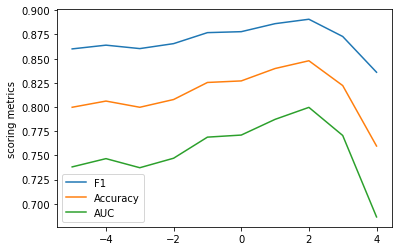

In [10]:
for i in range(-5,5):
    T.MSE_L2_Train(KernelTrainData, TrainLabels,10**(i))
    scores = Test(KernelTestData, TestLabels, T.MSE_L2_Return)
    print(i)

    F1s.append(scores[0])
    accuracies.append(scores[1])
    AUCs.append(scores[2])

plt.plot(range(-5,5), F1s, label = 'F1')
plt.plot(range(-5,5), accuracies, label = 'Accuracy')
plt.plot(range(-5,5), AUCs, label = 'AUC')
plt.ylabel('scoring metrics')
plt.legend()
plt.show()

As it can be seen, the case of L2 regularised Poly Kernel (degree 2) MSE is also substantially better than L2 regularised MSE in all four metrics.

In [11]:
F1s, accuracies, AUCs = [],[],[]
KernelTrainData = []
KernelTestData = []
for i in TrainData:
    KernelTrainData.append(T.Poly_Kernelise(i,3))
for i in TestData:
    KernelTestData.append(T.Poly_Kernelise(i,3))

print('Data Kernelised to degree 3')

Data Kernelised to degree 3


-5
-4
-3
-2
-1
0
1
2
3
4


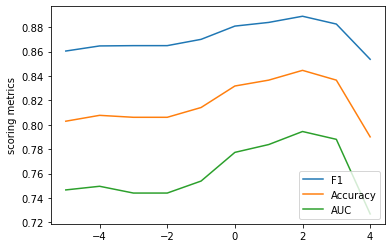

In [12]:
for i in range(-5,5):
    T.MSE_L2_Train(KernelTrainData, TrainLabels,10**(i))
    scores = Test(KernelTestData, TestLabels, T.MSE_L2_Return)
    print(i)

    F1s.append(scores[0])
    accuracies.append(scores[1])
    AUCs.append(scores[2])

plt.plot(range(-5,5), F1s, label = 'F1')
plt.plot(range(-5,5), accuracies, label = 'Accuracy')
plt.plot(range(-5,5), AUCs, label = 'AUC')
plt.ylabel('scoring metrics')
plt.legend()
plt.show()

### FLDM

In [ ]:
T.FLDM_Train(TrainData, TrainLabels)
scores = Test(TestData, TestLabels, T.FLDM_Return)
print('F1:',scores[0])
print('Accuracy:',scores[1])
print('AUC:',scores[2])

Trying lambda:  2
Trying lambda:  4
Trying lambda:  8
Trying lambda:  16
Trying lambda:  32
Trying lambda:  64
Trying lambda:  128
Trying lambda:  256
Trying lambda:  512
Trying lambda:  1024
Trying lambda:  2048
Trying lambda:  4096
Trying lambda:  8192
Trying lambda:  16384
Trying lambda:  32768
Trying lambda:  65536
Trying lambda:  131072
Trying lambda:  262144
Trying lambda:  524288
Trying lambda:  1048576
Trying lambda:  2097152
Trying lambda:  4194304
Trying lambda:  8388608
Trying lambda:  16777216
Trying lambda:  33554432
Trying lambda:  67108864
Trying lambda:  134217728
Trying lambda:  268435456
Trying lambda:  536870912
Trying lambda:  1073741824
Trying lambda:  2147483648
Trying lambda:  4294967296
Trying lambda:  8589934592
Trying lambda:  17179869184
Trying lambda:  34359738368
Trying lambda:  68719476736
Trying lambda:  137438953472
Trying lambda:  274877906944
Trying lambda:  549755813888
Trying lambda:  1099511627776
Trying lambda:  2199023255552
Trying lambda:  439804

FLDM gives singular matrix error, even for very large values of $\lambda$ (when we try to take $(S_w + \lambda*I)^{-1}$)

### Parzen Window Density Estimate
As in KNN, we test over a batch of 100 as testing is slow.

0
1
2
3
4
5
6


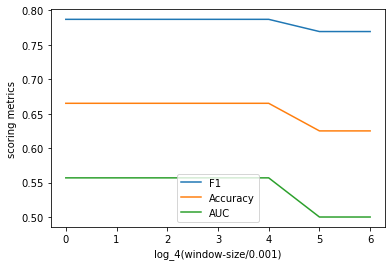

In [8]:
F1s, accuracies, AUCs = [],[],[]
for i in range(7):
    scores = Test(TestData, TestLabels, T.Parzen_Return, data=TrainData, labels=TrainLabels, window_size=0.001*4**i)
    print(i)
    F1s.append(scores[0])
    accuracies.append(scores[1])
    AUCs.append(scores[2])

plt.plot(range(7), F1s, label = 'F1')
plt.plot(range(7), accuracies, label = 'Accuracy')
plt.plot(range(7), AUCs, label = 'AUC')
plt.xlabel('log_4(window-size/0.001)')
plt.ylabel('scoring metrics')
plt.legend()
plt.show()

Error in graph above^. x-axis label is not window-size but rather $\log_4\frac{\text{window-size}}{0.001}$

### Bayesian with Gaussian CCD
We fit $P(x|y)$ to a gaussian, and use a Bayes' Classifier.

In [9]:
T.Bayes_Gauss_Train(TestData, TestLabels)
scores = Test(TestData, TestLabels, T.Bayes_Gauss_Return)
print('F1:',scores[0])
print('Accuracy:',scores[1])
print('AUC:',scores[2])

Gaussian initialised
Gaussian initialised


C:\Users\VINAYAK\anaconda3\envs\GAN_Project\lib\site-packages\scipy\stats\_multivariate.py:517: RuntimeWarning: overflow encountered in exp
  out = np.exp(self._logpdf(x, mean, psd.U, psd.log_pdet, psd.rank))


F1: 0.998719590268886
Accuracy: 0.9983974358974359
AUC: 0.9978632478632479


#### ^Amazing results!

## Bayes Classifier with GMM CCD
We fit $P(x|y)$ to a GMM with varying number of component gaussians and use a Bayes' classifier

In [7]:
F1s, accuracies, AUCs = [],[],[]
x_axis = range(2,5)
for i in x_axis:
    T.Bayes_GMM_Train(TrainData, TrainLabels, i, 25)
    print(i)
    scores = Test(TestData, TestLabels, T.Bayes_GMM_return)
    F1s.append(scores[0])
    accuracies.append(scores[1])
    AUCs.append(scores[2])

plt.plot(x_axis, F1s, label = 'F1')
plt.plot(x_axis, accuracies, label = 'Accuracy')
plt.plot(x_axis, AUCs, label = 'AUC')
plt.xlabel('no. of component gaussians')
plt.ylabel('scoring metrics')
plt.legend()
plt.show()

Gaussian initialised
Gaussian initialised
Gaussian initialised
Gaussian initialised
[0.5 0.5]
[0.5 0.5]
[0.25924534 0.74075466]
ValueError
ValueError
G1 iteration stopped at iteration:  1
[0.02926309 0.97073691]
ValueError
ValueError
G0 iteration stopped at iteration:  1
2
Gaussian initialised
Gaussian initialised
Gaussian initialised
Gaussian initialised
Gaussian initialised
Gaussian initialised
[0.33333333 0.33333333 0.33333333]
[0.33333333 0.33333333 0.33333333]
[0.25507476 0.6654301  0.07949514]
ValueError
ValueError
ValueError
G1 iteration stopped at iteration:  1
[0.02916186 0.54397953 0.42685861]
ValueError
ValueError
ValueError
G0 iteration stopped at iteration:  1
3
Gaussian initialised
Gaussian initialised
Gaussian initialised
Gaussian initialised
Gaussian initialised
Gaussian initialised
Gaussian initialised
Gaussian initialised
[0.25 0.25 0.25 0.25]
G1 iteration stopped at iteration:  0
[0.25 0.25 0.25 0.25]
G0 iteration stopped at iteration:  0
4


KeyboardInterrupt: 